### Big Data Science
# Analysis of Vizgen MERFISH dataset of mouse liver cells

## Running this Notebook
Below you can find instructions for installing and running this notebook from the head node of the Dask cluster.
### Setup
When running this notebook on the cluster head node for the first time you need to create a new Python 3.9.xx environment using `conda`

```
$ conda create -n bigdatascience python=3.9
```

Then activate the environment on the cluster:
```
$ conda activate
```

Next install the requirements on the cluster for this notebook using pip:

```
$ pip install -r requirements.
```

Next enable the python widgets to be able to display progress bars.

```
$ jupyter nbextension enable --py widgetsnbextension
```

Afterwards start a Jupyter Notebook on the head node:

```
$ jupyter notebook --no-browser --port=8890
```

To access Jupyter locally, you'll need an SSH tunnel. From another terminal on your **local** machine run:
```
$ ssh -N -L localhost:8888:localhost:8890 ldebackere@193.190.80.16 -p 50022
```

You can now access Jupyter on your local machine via [localhost:8888](http://localhost:8888)

### Adding new requirements
Installing any new requirements should happen via pip. To update the requirements.txt:
```
$ pip freeze > requirements.txt
```

In [1]:
import dask
from dask.distributed import Client
import dask.dataframe as dd
import dask.bag as db
import dask.array as da
import json
import numpy as np
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning) # Internal deprecation warnings of packages should be ignored
IS_REMOTE = False

In [2]:
if IS_REMOTE:
    client = Client('bds-head:8786')
else:
    client = Client(n_workers=8)

/home/ndossche/.conda/envs/scip/lib/python3.8/site-packages/distributed/node.py:181: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 40931 instead
  warnings.warn(
distributed.diskutils - INFO - Found stale lock file and directory '/home2/ndossche/BdsProject/tunneling/dask-worker-space/worker-c62nqxax', purging
distributed.diskutils - INFO - Found stale lock file and directory '/home2/ndossche/BdsProject/tunneling/dask-worker-space/worker-_wzdhhte', purging
distributed.diskutils - INFO - Found stale lock file and directory '/home2/ndossche/BdsProject/tunneling/dask-worker-space/worker-2vobiuyg', purging


## Configuration section

This section configures the location of files, and other variable parameters such as the image offset.
For example, for both 1_000.zarr and 45_000.zarr, the image offset is (45_000, 45_000) because these subsets are actually from inside the bigger image at (45_000, 45_000) x (90_000, 90_000).

In [3]:
CFG_IMAGE_OFFSET = (45_000, 45_000) # Fixed for all input datasets
CFG_HDFS_HOST = 'hdfs://bds-head:9000'
CFG_FILE_PREFIX = CFG_HDFS_HOST + '/data/'
CFG_ZARR_IMAGE = CFG_FILE_PREFIX + '1_000.zarr' # '1_000.zarr'
CFG_ZARR_IMAGE_LARGE = CFG_FILE_PREFIX + '45_000.zarr' 
CFG_LIVER_PREFIX = '/data/vz-liver-showcase/Liver1Slice1/'
CFG_LIVER_IMAGES_MANIFEST = CFG_HDFS_HOST + CFG_LIVER_PREFIX + 'detected_transcripts.csv' # Contains information about coordinates
CFG_LIVER_TRANSCRIPT_CSV = CFG_HDFS_HOST + CFG_LIVER_PREFIX + 'detected_transcripts.csv' # Contains information about coordinates
CFG_CELL_BOUNDARIES = CFG_LIVER_PREFIX + 'cell_boundaries'

## Loading the dataset

In [4]:
z = da.from_zarr(CFG_ZARR_IMAGE)
z

2022-05-28 16:56:41,794 WARN util.NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


dask.array<from-zarr, shape=(7, 1000, 1000), dtype=uint16, chunksize=(1, 1000, 1000), chunktype=numpy.ndarray>

In [5]:
# Reference segmentation raster
reference_segmentation_raster = np.load('/data/segmentation_raster_' + CFG_ZARR_IMAGE[len(CFG_FILE_PREFIX):-5].replace('_', '') + '.npy')
reference_segmentation_raster

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [6]:
# We will read the manifest file about the images such that no hardcoding of constants is used,
# and thus our code generalises to other data of the same kind.
#b = db.read_text(CFG_LIVER_IMAGES_MANIFEST).map(json.loads)
#b.compute()

# TODO: note: deze file ontbreekt op de hdfs, dus de claim van in de transformation example notebook dat je de metadata in die file moet bekijken klopt dus niet
#       Therefore, for now, manueel heb ik hier de values vd json gekopieerd, als de json (ooit) beschikbaar komt, dan kunnen die gwn hier verbatim in vervangen worden :)
COORDS_MICRONS_PER_PIXEL = 0.108
IMAGE_BBOX_OFFSET = (-41.61239999999996, -107.97948000000231)

def micron_to_pixels(df, xy_columns=[('x', 'y')], reversed=True):
    coord_remapper_x, coord_remapper_y = (1, 0) if reversed else (0, 1)
    
    for x, y in xy_columns:
        df[x] -= IMAGE_BBOX_OFFSET[coord_remapper_x]
        df[y] -= IMAGE_BBOX_OFFSET[coord_remapper_y]
        df[x] /= COORDS_MICRONS_PER_PIXEL
        df[y] /= COORDS_MICRONS_PER_PIXEL
        df[x] -= CFG_IMAGE_OFFSET[coord_remapper_x]
        df[y] -= CFG_IMAGE_OFFSET[coord_remapper_y]
    df = df.astype({
        col:'int64' for cols in xy_columns for col in cols
    })
    return df

def micron_list_to_pixels(microns):
    xs = []
    ys = []
    for micron in microns:
        x = micron[0]
        y = micron[1]
        x -= IMAGE_BBOX_OFFSET[0]
        y -= IMAGE_BBOX_OFFSET[1]
        x /= COORDS_MICRONS_PER_PIXEL
        y /= COORDS_MICRONS_PER_PIXEL
        x -= CFG_IMAGE_OFFSET[0]
        y -= CFG_IMAGE_OFFSET[1]
        xs.append(x)
        ys.append(y)

    return xs, ys

# Instead of transforming the dataframe, do a more performant approach (?) by simply transforming our own coordinates
def pixels_to_micron(x, y):
    x += CFG_IMAGE_OFFSET[0]
    y += CFG_IMAGE_OFFSET[1]
    x *= COORDS_MICRONS_PER_PIXEL
    y *= COORDS_MICRONS_PER_PIXEL
    x += IMAGE_BBOX_OFFSET[0]
    y += IMAGE_BBOX_OFFSET[1]
    return x, y

def pixels_to_microns(xs, ys, offset=45_000):
    output = []
    for x, y in zip(xs, ys):
        if offset:
            x += offset
            y += offset
        x *= COORDS_MICRONS_PER_PIXEL
        y *= COORDS_MICRONS_PER_PIXEL
        x += IMAGE_BBOX_OFFSET[0]
        y += IMAGE_BBOX_OFFSET[1]
        output.append([x, y])
    return output

In [7]:
# RE: binary format
# Dask dataframes are already stored in-memory in a binary form.
# To reduce memory usage I discard some columns during the reading of the file with "usecols".
# We also can't seem to easily control the chunking on HDFS with a custom partitioning method.
# Luckily, there's a "query" method that seems to stream-scan the data.
# We can create a single query for each image tile inside a chunk, which seems like the most promising solution (?)

# Optimisation to store as binary
detected_transcripts_dtype = {
    'global_x': 'float32',
    'global_y': 'float32',
    'gene': 'string',
    'transcript_id': 'string'
}

detected_transcripts = dd.read_csv(CFG_LIVER_TRANSCRIPT_CSV, usecols=['global_x', 'global_y', 'gene', 'transcript_id'], dtype=detected_transcripts_dtype)
detected_transcripts.head()

2022-05-28 16:56:43,628 WARN util.NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


,global_x,global_y,gene,transcript_id
0,2506.406982,-95.451477,Comt,ENSMUST00000000335
1,2531.844727,-95.187019,Comt,ENSMUST00000000335
2,2483.796875,-91.360115,Comt,ENSMUST00000000335
3,2505.769287,-84.081650,Comt,ENSMUST00000000335
4,2501.394043,-81.387093,Comt,ENSMUST00000000335


In [8]:
# Compute which genes are in the transcripts
genes = detected_transcripts['gene'].unique().compute()
genes = {genes[i]:i for i in range(len(genes))}

2022-05-28 16:56:46,344 WARN util.NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
2022-05-28 16:56:46,376 WARN util.NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
2022-05-28 16:56:46,393 WARN util.NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
2022-05-28 16:56:46,453 WARN util.NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
2022-05-28 16:56:46,469 WARN util.NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
2022-05-28 16:56:46,471 WARN util.NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
2022-05-28 16:56:46,478 WARN util.NativeCodeLoader: Unable to load native-ha

In [9]:
cell_metadata = dd.read_csv(CFG_HDFS_HOST + CFG_LIVER_PREFIX + 'cell_metadata.csv').set_index('Unnamed: 0')
cell_metadata.head()

,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
Unnamed: 0,,,,,,,,
100001171973967687856871852958561550684,448,258.785001,7655.611888,2097.761134,7651.659141,7659.564636,2092.873762,2102.648506
100001634376272866159436983932943835658,593,448.313746,3330.146689,2747.439581,3325.176206,3335.117171,2742.520921,2752.358241
10000182422355825632601905008558158457,520,336.375839,4659.941690,2473.528649,4655.883528,4663.999851,2468.565275,2478.492023
100003917830248135184709264195950180189,1724,1589.438739,7178.452967,8687.112792,7166.387947,7190.517986,8678.986623,8695.238961
100007025307614003150182034903170333553,569,479.334573,5455.395261,2629.849932,5450.434960,5460.355563,2624.722864,2634.977001


In [10]:
xy_columns = [
    ('center_x', 'center_y'),
    ('min_x', 'min_y'),
    ('max_x', 'max_y'),
]

cell_metadata_df = micron_to_pixels(cell_metadata, xy_columns=xy_columns, reversed=False)
# also scale the volume
cell_metadata_df.volume /= .108
cell_metadata_df.head()

,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
Unnamed: 0,,,,,,,,
100001171973967687856871852958561550684,448,2396.157418,26270,-24576,26233,26307,-24621,-24531
100001634376272866159436983932943835658,593,4151.053207,-13780,-18560,-13826,-13733,-18606,-18515
10000182422355825632601905008558158457,520,3114.591105,-1467,-21097,-1504,-1429,-21143,-21051
100003917830248135184709264195950180189,1724,14717.025362,21852,36436,21740,21964,36360,36511
100007025307614003150182034903170333553,569,4438.283081,5898,-19649,5852,5944,-19697,-19602


In [11]:
def create_xy_filter(xy_columns, start=0, end=1_000):
    return ' | '.join([
        f'{start} < {x} < {end} & {start} < {y} < {end}' for (x, y) in xy_columns
    ])

In [12]:
xy_filter = create_xy_filter(xy_columns=[('center_x', 'center_y')])
cell_metadata_df_subset = cell_metadata_df.query(xy_filter).compute()
cell_metadata_df_subset.head()

,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
Unnamed: 0,,,,,,,,
11021881538097360326178295536714020665,1052,4931.854780,182,508,131,232,458,557
111827048809983291173092260848892876168,1052,8580.492558,231,992,169,294,906,1079
121066659063065755533842851784891185345,1052,4875.302204,418,686,377,460,623,749
134116183819398234976340911705101034837,1052,5764.080115,276,653,228,324,591,714
147229130923685753228684550605476535750,1052,4265.106725,232,738,183,282,691,784


## Z-stack projection
Tissues are 3D structures, but images are 2D. To correct for this, the fluorescence images are obtained at different depths in the tissue. This means that from the tissue, different slices were taken (like loaves of bread), and multiple were captured. These slices are referred to as the Z-stack. 

**NOTE: the distance between the different Z-stacks is small compared to the size of a cell.**

Different cells are in focus at different depths in the stack, so we need to project the stack into one image. This can be done by calculating a value for every pixel location based on all values over the Z-stack of this pixel. Options are a maximal projection, a minimal projection, a mean projection, or a median projection. These four options have to be implemented, tested and the results compared. The method that gives the clearest contrast between the objects and the background should be chosen. Include an example image of each projection in your report.

In [13]:
def zstack_normalization(arr, operation, dtype=np.float64):
    if operation == 'mean':
        return da.mean(arr, axis=0, dtype=dtype)
    if operation == 'median':
        return da.median(arr, axis=0).astype(dtype)
    if operation == 'min':
        return da.min(arr, axis=0).astype(dtype)
    if operation == 'max':
        return da.max(arr, axis=0).astype(dtype)
    
    raise ValueError("Operation not found.")

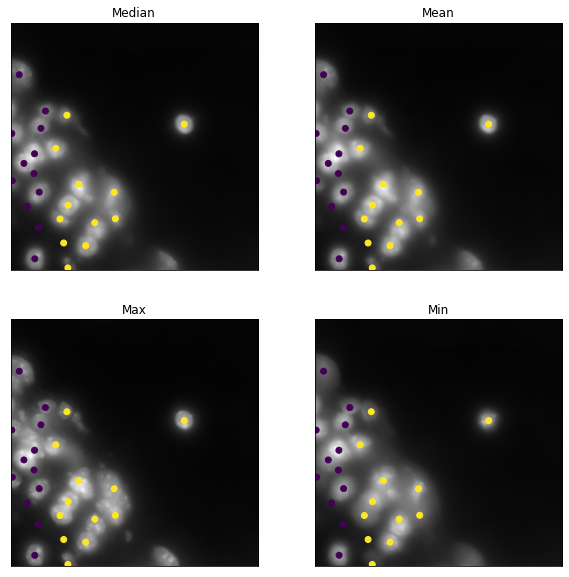

In [14]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(2, 2, figsize=(10,10))
axs[0, 0].imshow(zstack_normalization(z, 'median', dtype=np.uint16).compute(),cmap='gray')
axs[0, 0].scatter(cell_metadata_df_subset.center_x, cell_metadata_df_subset.center_y, c=cell_metadata_df_subset.fov)
axs[0, 0].set_title('Median')
axs[0, 1].imshow(zstack_normalization(z, 'mean', dtype=np.uint16).compute(),cmap='gray')
axs[0, 1].scatter(cell_metadata_df_subset.center_x, cell_metadata_df_subset.center_y, c=cell_metadata_df_subset.fov)
axs[0, 1].set_title('Mean')
axs[1, 0].imshow(zstack_normalization(z, 'max', dtype=np.uint16).compute(),cmap='gray')
axs[1, 0].scatter(cell_metadata_df_subset.center_x, cell_metadata_df_subset.center_y, c=cell_metadata_df_subset.fov)
axs[1, 0].set_title('Max')
axs[1, 1].imshow(zstack_normalization(z, 'min', dtype=np.uint16).compute(),cmap='gray')
axs[1, 1].scatter(cell_metadata_df_subset.center_x, cell_metadata_df_subset.center_y, c=cell_metadata_df_subset.fov)
axs[1, 1].set_title('Min')

for ax in axs.flat:
    ax.set_xticks([])
    ax.set_yticks([])

In [15]:
best = zstack_normalization(z, 'max', dtype=np.uint16)
best

dask.array<amax-aggregate, shape=(1000, 1000), dtype=uint16, chunksize=(1000, 1000), chunktype=numpy.ndarray>

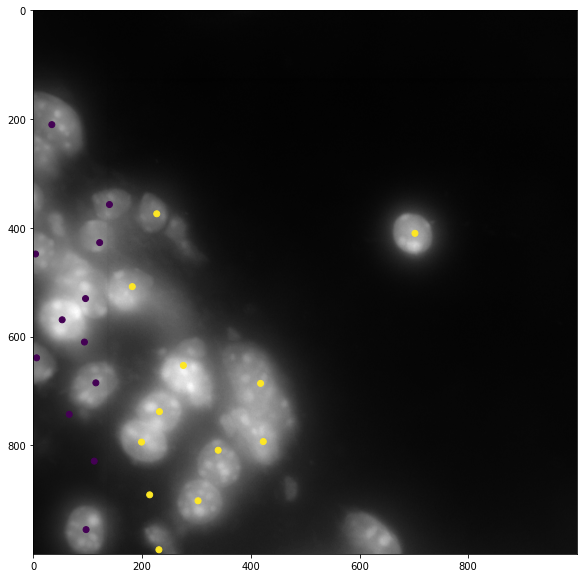

In [16]:
fig, ax = plt.subplots(figsize=(30, 10))
ax.imshow(best.compute(), cmap="gray")
ax.scatter(cell_metadata_df_subset.center_x, cell_metadata_df_subset.center_y, c=cell_metadata_df_subset.fov)
plt.show()

From [research](https://www.sciencedirect.com/science/article/pii/S0165027017304119?casa_token=zYNTRsFS0fUAAAAA:OEFW0jc4iLVDcOngaS4DjXihdu13dOT8Wkwnq6bLbZgunk7rX1nDrWQFyocXJrqCFrZ77dudYAQ#fig0030) on evaluating performance of different projection algorithms and based on our own empirical results we've determined that the maximum projection yields the sharpest and most detailed projection of the z-stack.

## Image preprocessing
After the Z-stack is merged into one image, the image needs to be processed. First, we will check the image thoroughly and remove any technical artifacts that might be present. For optimal downstream results, the image should be evenly illuminated and have clear contrast between cells and background. To enhance the image quality, different steps need to be taken. First, a top hat filter needs to be used. Top hat filters subtract background noise, making the nuclei or cell boundary pop out more. 

The Bia-Pol blog contains more information on top-hat filters (https://biapol.github.io/blog/ryan_savill/03_background_subtraction/)

Next, you need to enhance the overall contrast of the image, making it easier to identify
cells in the image. 

This can be achieved with histogram equalization. (https://docs.opencv.org/3.4/d5/daf/tutorial_py_histogram_equalization.html)

Every step should be visualized in your report on an example image. Extra steps that
improve the image quality for downstream analysis may always be added.

In [17]:
from skimage.morphology import white_tophat, black_tophat, disk
import cv2

def tophat_filter(image, radius):
    # Scikit-image's tophat filter is veeeery slow.
    # While OpenCV2's implemetation is very fast due to a native SIMD implementation.
    #%time str_el = disk(radius)
    #return white_tophat(image, str_el)
    str_el = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (radius, radius))
    return cv2.morphologyEx(image, cv2.MORPH_TOPHAT, str_el)

In [18]:
from skimage import filters

# This function uses a single gaussian to denoise
def gaussian_blur_to_reduce_noise(img, dtype=np.float64):
    return filters.gaussian(img, sigma=3, mode='nearest')

# This function will use the difference of gaussians to denoise
def gaussian_diff_to_reduce_noise(img, dtype=np.float64):
    return filters.difference_of_gaussians(img, 3, 300)

In [19]:
from skimage import exposure

def histogram_equalization(img, dtype=np.float64):
    return exposure.equalize_adapthist(img).astype(dtype)

In [20]:
def preprocessing(image, radius=100, dtype=np.float64, denoise_fn=gaussian_blur_to_reduce_noise):
    if denoise_fn:
        image = denoise_fn(image)
    return histogram_equalization(tophat_filter(image, radius=radius), dtype=dtype)

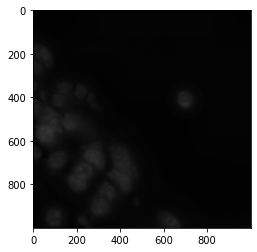

In [21]:
from matplotlib import pyplot as plt

# Zonder noise reductie
plt.imshow(best.map_blocks(\
                           lambda image: preprocessing(image, denoise_fn=None), chunks=(1000,1000), dtype=np.uint16\
                          ).compute(), cmap="gray")

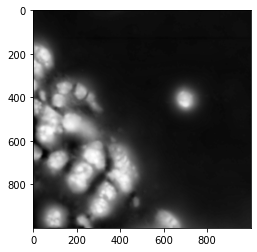

In [22]:
# Met noise reductie
plt.imshow(best.map_blocks(preprocessing, dtype=np.uint16, chunks=(1000,1000)).compute(), cmap="gray")

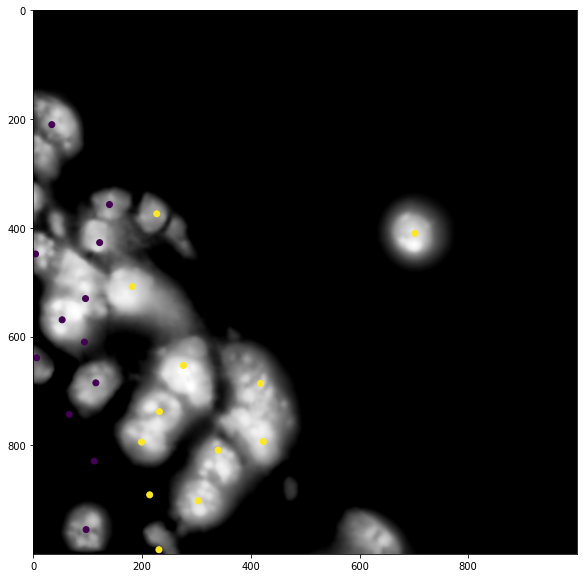

In [23]:
fig, ax = plt.subplots(figsize=(30, 10))
ax.imshow(best.map_blocks(preprocessing, dtype=np.uint16, denoise_fn=gaussian_diff_to_reduce_noise, chunks=(1000,1000)).compute(), cmap="gray")
ax.scatter(cell_metadata_df_subset.center_x, cell_metadata_df_subset.center_y, c=cell_metadata_df_subset.fov)
plt.show()

## Segmentation

In [24]:
from skimage.segmentation import watershed
from skimage.filters import threshold_multiotsu
from skimage.feature import peak_local_max
from skimage.measure import label
from skimage.morphology import closing, opening, square, erosion, dilation
from scipy.ndimage import distance_transform_edt

def threshold_image(image):
    threshold = threshold_multiotsu(image, classes=2)
    cells = image > threshold
    return cells

def segmentation(image):
    cells = threshold_image(image)
    
    distance = distance_transform_edt(cells)
    
    local_max_coords = peak_local_max(distance, min_distance=7)
    local_max_mask = np.zeros(distance.shape, dtype=bool)
    local_max_mask[tuple(local_max_coords.T)] = True
    markers = label(local_max_mask)
    
    segmented_cells = watershed(-distance, markers, mask=cells)
        
    return segmented_cells

In [25]:
# Meta argument is passed to tell Dask the format of the output, otherwise the function is run with a 0D-input => problems!
block_normalized_meta = np.array((), dtype=np.float64)
result_without_plot = best.map_blocks(preprocessing, denoise_fn=gaussian_diff_to_reduce_noise, chunks=(10,10)).map_blocks(segmentation, meta=block_normalized_meta, chunks=(1000,1000)).compute()

In [26]:
best_preprocessed = best.map_blocks(preprocessing, denoise_fn=gaussian_diff_to_reduce_noise, chunks=(10,10)).compute()

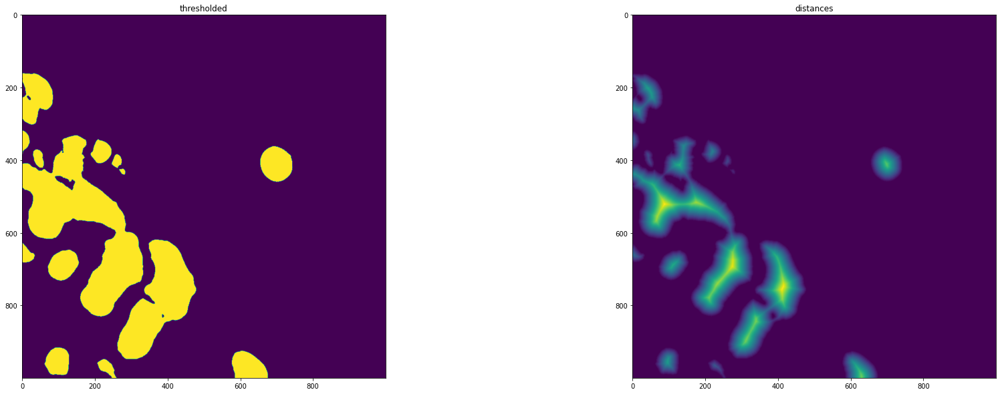

In [27]:
# DEBUG segmentation showing the threshold
def show_segmentation_debug(image):
    denoised = image
    cells = threshold_image(image)
    
    names = ['thresholded', 'distances']
    fig, ax = plt.subplot_mosaic([names], figsize=(30, 10))
    ax['thresholded'].set_title('thresholded')
    ax['distances'].set_title('distances')
    
    ax['thresholded'].imshow(cells)
    distance = distance_transform_edt(cells)
    ax['distances'].imshow(distance)

show_segmentation_debug(best_preprocessed)

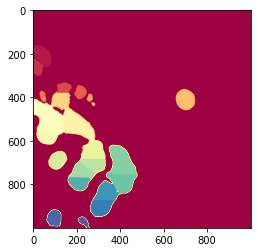

In [28]:
plt.imshow(result_without_plot, cmap="Spectral")

The outcome of the segmentation algorithm should be visualized. This should be done
by overlaying the original image with the segmentation mask. This way you can check
visually if all nuclei were identified in the segmentation. 

In [29]:
def single_channel_to_rgb(numpy_array):
    return np.stack((numpy_array / np.max(numpy_array),) * 3, axis=-1)

def lerp(a, b, t):
    return b * t + a * (1 - t)

def stupid_hash_to_mangle_colors(number, m):
    # Regular number will return colors close to each other
    # That means if two cells close to each other get colored, their color looks quite similar
    # This perturbs the color in a stupid, but effective way
    #return ((number >> 3) * 31 + number) % m
    return number

In [30]:
from matplotlib import cm

amount_of_needed_colors = int(np.max(result_without_plot)+1)
matplotlib_color_map = cm.get_cmap('nipy_spectral', amount_of_needed_colors)
color_map = np.array([
    np.array(matplotlib_color_map(stupid_hash_to_mangle_colors(i, amount_of_needed_colors))[:3])
    for i in range(0, amount_of_needed_colors)
])

best_rgb = single_channel_to_rgb(best)
result_without_plot_rgb = color_map[result_without_plot]

# COMMENT (@laurensdeb): Adding the .compute() here because dask started throwing KilledWorkers on this
result_with_segments_highlighted_rgb = lerp(best_rgb.compute(), result_without_plot_rgb, 0.4)

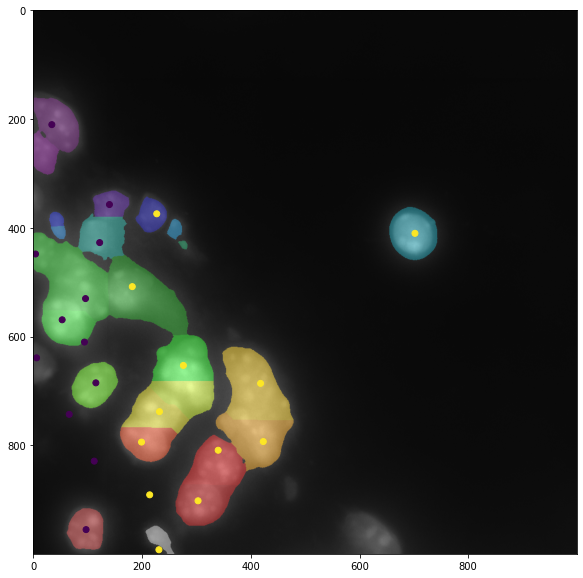

In [31]:
fig, ax = plt.subplots(figsize=(30, 10))
ax.imshow(result_with_segments_highlighted_rgb)
ax.scatter(cell_metadata_df_subset.center_x, cell_metadata_df_subset.center_y, c=cell_metadata_df_subset.fov)
plt.show()

In [32]:
from skimage.measure import regionprops, find_contours, approximate_polygon
from matplotlib.patches import Rectangle

def region_is_big_enough_to_be_a_cell(props):
    MIN_SIZE = 35
    # Use the fact that a cell is always somewhat round or elliptical, not an almost-flat-spaghetti-line
    start_y, start_x, end_y, end_x = props.bbox
    width = end_x - start_x
    height = end_y - start_y
    return props.area >= MIN_SIZE * MIN_SIZE and min(width, height) >= MIN_SIZE

def sort_xy(x, y):
    # https://stackoverflow.com/questions/58377015
    mean_x = np.mean(x)
    mean_y = np.mean(y)
    r = np.sqrt((x - mean_x) ** 2 + (y - mean_y) ** 2)
    angles = np.where((y - mean_y) > 0, np.arccos((x - mean_x) / r), 2 * np.pi - np.arccos((x - mean_x) / r))
    mask = np.argsort(angles)
    x_sorted = x[mask]
    y_sorted = y[mask]
    return x_sorted, y_sorted

def convert_region_to_own_representation(region, simplify_contours):
    # Does not work because the contours are not fully connected components :'(
    #contour = region.coords
    #found_contours = find_contours(region.image_filled, 0.9999)
    #contour = numpy.concatenate(numpy.array(found_contours))
    #contour[:, 0] += region.bbox[0]
    #contour[:, 1] += region.bbox[1]
    
    distance = distance_transform_edt(np.pad(region.image_filled, 1, mode='constant'))
    #plt.imshow(distance)
    #plt.show()
    contour = np.array(np.where(distance == 1))
    
    contour = np.swapaxes(contour, 0, 1)
    contour[:, 0] += region.bbox[0]
    contour[:, 1] += region.bbox[1]
    
    # Needs to be sorted in an orientation, otherwise skimage algorithms and visualisations fail...
    sorted_x, sorted_y = sort_xy(contour[:, 0], contour[:, 1])
    contour = np.dstack([sorted_x, sorted_y])[0]
    
    if simplify_contours:
        contour = approximate_polygon(contour, 3)
    
    return {
        'bbox': region.bbox,
        'contour': contour
    }

def compute_cell_regions(segmented_image, simplify_contours=True):
    # Note: Simplifying the contour can be useful to improve performance and have less rigged edges
    
    # https://scikit-image.org/docs/stable/auto_examples/segmentation/plot_regionprops.html
    regions = regionprops(segmented_image)
    
    filtered_regions = [
        convert_region_to_own_representation(region, simplify_contours)
        for region in regions
        if region_is_big_enough_to_be_a_cell(region)
    ]
    
    #print(filtered_regions) # DEBUG INFO
    #print(len(filtered_regions), 'regions after filtering') # DEBUG INFO
    return filtered_regions

The following visualisation shows the own bounding boxes in red, and the reference bounding boxes in blue.

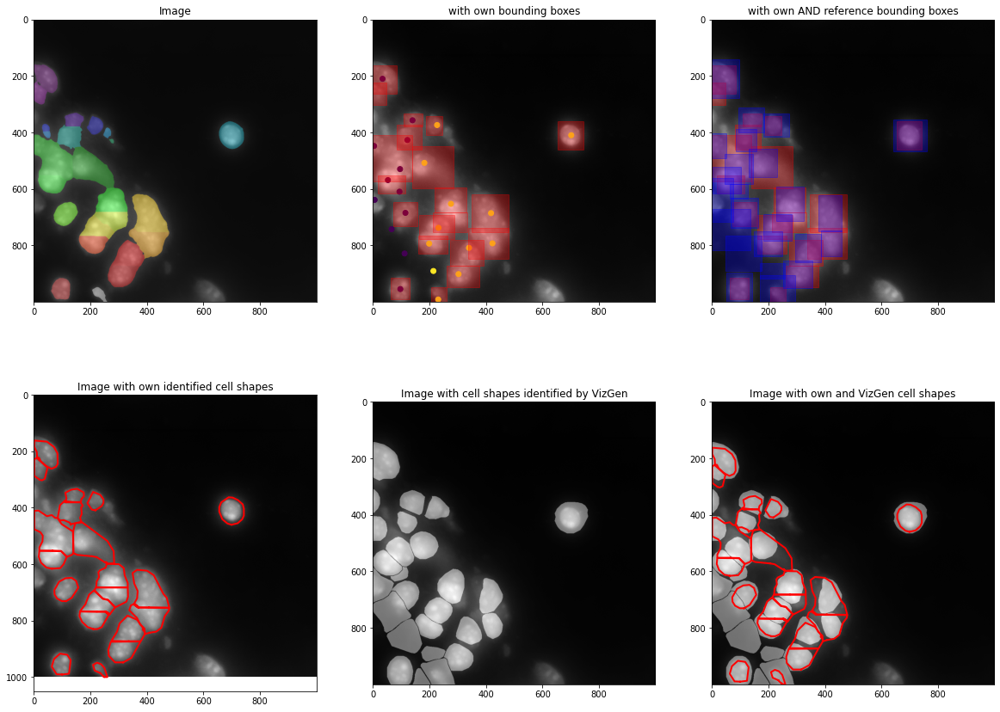

In [33]:
# Visualisation code of the bounding boxes of the segmentation
names = [['image', 'bbox_own', 'bbox_overlap'], ['shapes_own', 'contours_vizgen', 'contours_overlap']]
fig, ax = plt.subplot_mosaic(names, figsize=(20, 15))
ax['image'].set_title('Image')
ax['bbox_own'].set_title('with own bounding boxes')
ax['bbox_overlap'].set_title('with own AND reference bounding boxes')
ax['shapes_own'].set_title('Image with own identified cell shapes')
ax['contours_vizgen'].set_title('Image with cell shapes identified by VizGen')
ax['contours_overlap'].set_title('Image with own and VizGen cell shapes')
ax['image'].imshow(result_with_segments_highlighted_rgb)
ax['bbox_own'].scatter(cell_metadata_df_subset.center_x, cell_metadata_df_subset.center_y, c=cell_metadata_df_subset.fov)
ax['bbox_own'].imshow(best, cmap='gray')
ax['bbox_overlap'].imshow(best, cmap='gray')
ax['shapes_own'].imshow(best, cmap='gray')
ax['contours_vizgen'].imshow(best, cmap='gray')
ax['contours_overlap'].imshow(best, cmap='gray')

# Note: I'd like to keep the rectangle visualisations (think about the report)
result_without_plot_cell_regions = compute_cell_regions(result_without_plot)
for props in result_without_plot_cell_regions:
    start_y, start_x, end_y, end_x = props['bbox']
    width = end_x - start_x
    height = end_y - start_y
    # Note: reusing rectangle instances in multiple add_patch calls is not supported
    ax['bbox_own'].add_patch(Rectangle((start_x, start_y), width, height, color='red', alpha=0.3))
    ax['bbox_overlap'].add_patch(Rectangle((start_x, start_y), width, height, color='red', alpha=0.3))
    # Also draw our own cell shapes
    cell_contour = props['contour']
    ax['shapes_own'].plot(cell_contour[:, 1], cell_contour[:, 0], '-r', linewidth=2)
    ax['contours_overlap'].plot(cell_contour[:, 1], cell_contour[:, 0], '-r', linewidth=2)

# Reference bounding boxes
for reference_cell in cell_metadata_df_subset.to_dict('records'):
    start_y, start_x, end_y, end_x = (reference_cell['min_y'], reference_cell['min_x'], reference_cell['max_y'], reference_cell['max_x'])
    width = end_x - start_x
    height = end_y - start_y
    ax['bbox_overlap'].add_patch(Rectangle((start_x, start_y), width, height, color='blue', alpha=0.3))
    
# Load pre-processed VizGen cell contours
#from spatialpandas.io import read_parquet

#loaded_subset = read_parquet('1_000_cell_outlines.parq')
#geodf = loaded_subset[loaded_subset.z == 0].to_geopandas()
#transformed_polygon = geodf.polygon.translate(41.61239999999996, 107.97948000000231)
#transformed_polygon = transformed_polygon.affine_transform([1000/108, 0, 0, 1000/108, -45000, -45000])
#transformed_polygon.plot(ax=ax['contours_vizgen'], facecolor='none', edgecolor='blue',linewidth=3)
#transformed_polygon.plot(ax=ax['contours_overlap'], facecolor='none', edgecolor='blue',linewidth=3)
ax['contours_vizgen'].imshow(reference_segmentation_raster[0:1000,0:1000], alpha=0.4, cmap='gray')
ax['contours_overlap'].imshow(reference_segmentation_raster[0:1000,0:1000], alpha=0.4, cmap='gray')

## Jaccard Index

In [34]:
from skimage import draw

def image_of_filled_contours(regions):
    filled_image = np.zeros((1002, 1002), dtype='bool') # Padding necessary to draw polygons on the edge as that might color the border as well
    for region in regions:
        contour = region['contour']
        rr, cc = draw.polygon(contour[:, 0], contour[:, 1])
        filled_image[rr, cc] = True

    # Cut away padding
    return filled_image[:1000, :1000]

def image_of_filled_rectangles(rectangles):
    filled_image = np.zeros((1002, 1002), dtype='bool') # Padding necessary to draw polygons on the edge as that might color the border as well
    for rectangle in rectangles:
        min_x, min_y, max_x, max_y = rectangle['bbox']
        rr, cc = draw.rectangle((min_x, min_y), (max_x, max_y))
        filled_image[rr, cc] = True
    
    return filled_image[:1000, :1000]

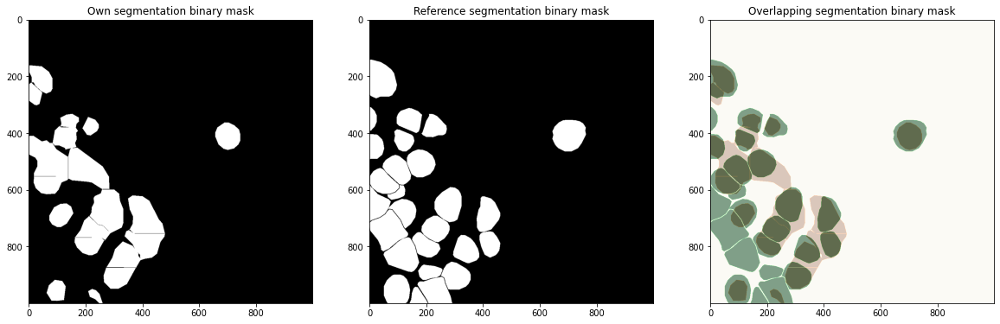

In [35]:
names = [['own', 'ref', 'overlap']]
fig, ax = plt.subplot_mosaic(names, figsize=(20, 15))
ax['own'].set_title('Own segmentation binary mask')
ax['ref'].set_title('Reference segmentation binary mask')
ax['overlap'].set_title('Overlapping segmentation binary mask')

# Example of our own shapes from the segmentation in a binary image format
#result_without_plot_cell_regions # Already calculated in the above visualisation
filled_image_with_own_contours = image_of_filled_contours(result_without_plot_cell_regions)
ax['own'].imshow(filled_image_with_own_contours, cmap='gray')
ax['ref'].imshow(reference_segmentation_raster[0:1000,0:1000], cmap='gray')
ax['overlap'].imshow(filled_image_with_own_contours, cmap='Oranges', alpha=0.5)
ax['overlap'].imshow(reference_segmentation_raster[0:1000,0:1000], cmap='Greens', alpha=0.5)

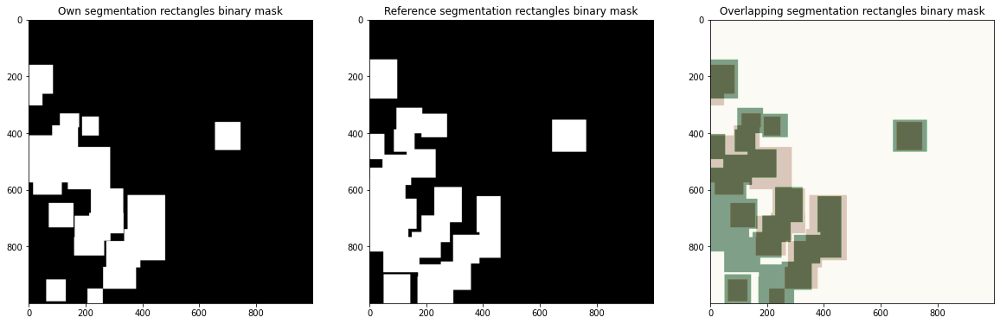

In [36]:
def convert_reference_metadata_records_to_rectangles(records):
    def clamp(v):
        if v < 0:
            return 0
        if v >= 1000:
            return 999
        return v
    
    return list(map(lambda item: {'bbox': (clamp(item['min_y']), clamp(item['min_x']), clamp(item['max_y']), clamp(item['max_x']))}, records))


names = [['own', 'ref', 'overlap']]
fig, ax = plt.subplot_mosaic(names, figsize=(20, 15))
ax['own'].set_title('Own segmentation rectangles binary mask')
ax['ref'].set_title('Reference segmentation rectangles binary mask')
ax['overlap'].set_title('Overlapping segmentation rectangles binary mask')

# Example of our own rectangles from the segmentation in a binary image format
filled_image_with_own_rectangles = image_of_filled_rectangles(result_without_plot_cell_regions)
filled_image_with_reference_rectangles = image_of_filled_rectangles(convert_reference_metadata_records_to_rectangles(cell_metadata_df_subset.to_dict('records')))

ax['own'].imshow(filled_image_with_own_rectangles, cmap='gray')
ax['ref'].imshow(filled_image_with_reference_rectangles, cmap='gray')
ax['overlap'].imshow(filled_image_with_own_rectangles, cmap='Oranges', alpha=0.5)
ax['overlap'].imshow(filled_image_with_reference_rectangles, cmap='Greens', alpha=0.5)

In [37]:
def jaccard_index_of_2_images(image1, image2):
    return np.sum(image1 & image2) / np.sum(image1 | image2)

**Effective Jaccard Index numbers:**

A segmentation is also provided by VizGen. Your segmentation has to be checked against
theirs. Similarity between segmentations can be quantified using the Jaccard index.

**Note**
While the Jaccard index seems low, it looks like the blue bounding boxes are often too small to encorporate the whole cell. It is also worth noting that our shapes are often smaller than the reference because the reference used markers to identify the cell's membrane etc.

In [38]:
print('Jaccard index of own shapes vs reference shapes', jaccard_index_of_2_images(filled_image_with_own_contours, reference_segmentation_raster[0:1000,0:1000]))
print('Jaccard index of own rectangles vs reference rectangles', jaccard_index_of_2_images(filled_image_with_reference_rectangles, filled_image_with_own_rectangles))
print('Jaccard index of own shapes vs reference rectangles', jaccard_index_of_2_images(filled_image_with_own_contours, filled_image_with_reference_rectangles))
print('Jaccard index of own rectangles vs reference shapes', jaccard_index_of_2_images(filled_image_with_reference_rectangles, reference_segmentation_raster[0:1000,0:1000]))

Jaccard index of own shapes vs reference shapes 0.5047417623246847
Jaccard index of own rectangles vs reference rectangles 0.5668276706255996
Jaccard index of own shapes vs reference rectangles 0.49992036296286185
Jaccard index of own rectangles vs reference shapes 0.7801965784361458


### Impact of different projections on Jaccard Index

| Projection | Own Shapes vs. Ref. Shapes | Own Rect. vs. Ref. Rect | Own Shapes vs. Ref. Rect |
| --- | --- | --- | --- |
| Maximum | 0.5047417623246847 | 0.5668276706255996 | 0.49992036296286185 |
| Minimum | 0.4954377533846366 | 0.5444744391507079| 0.4912719472618508 |
| Median | 0.5239901116514085 | 0.578898773826679 | 0.5048568759184402 |
| Mean | 0.522963687804463 | 0.5788865965377007 | 0.5160638559756987 |

## Gene allocation

In [39]:
def convert_point_to_micron_coordinates(tile_offset, xy):
    # Convert coordinates to data frame coordinates:
    #  - Add offset of tile
    #  - Convert from pixels to microns
    tile_offset_x, tile_offset_y = tile_offset
    x, y = xy
    x += tile_offset_x
    y += tile_offset_y
    x, y = pixels_to_micron(x, y)
    return x, y

def convert_rectangle_to_micron_coordinates(tile_offset, rectangle):
    return (
        *convert_point_to_micron_coordinates(tile_offset, (rectangle[0], rectangle[1])),
        *convert_point_to_micron_coordinates(tile_offset, (rectangle[2], rectangle[3]))
    )

def create_filter_single_rectangle(xy_column, min_y, min_x, max_y, max_x):
    """Creates a filter that can be used on a dataframe to filter to data contained within the provided rectangle"""
    return f'({min_x} < {xy_column[0]} < {max_x} & {min_y} < {xy_column[1]} < {max_y})'


def create_filter_multiple_rectangles(xy_column, rectangles):
    """Creates a filter that can be used on a dataframe to filter to data contained within the provided rectangles
    The format of the rectangles is a list of the form [(min_y, min_x, max_y, max_x), ...]
    """
    return ' | '.join([
         create_filter_single_rectangle(xy_column, *rectangle) for rectangle in rectangles
    ])

Visualisation of **all genes in the 1000x1000 area**, useful to evaluate our gene allocation against.
It overlays the heatmap on top of the input image

In [86]:
#converted_coordinates_for_tile = convert_rectangle_to_micron_coordinates((0, 0), (0, 0, 1_000, 1_000))
#transcripts_query_filter = create_filter_single_rectangle(['global_y', 'global_x'], *converted_coordinates_for_tile)
#transcripts_for_these_regions = detected_transcripts.query(transcripts_query_filter).compute()

In [87]:
#print(len(transcripts_for_these_regions))
#transcripts_for_these_regions.head()

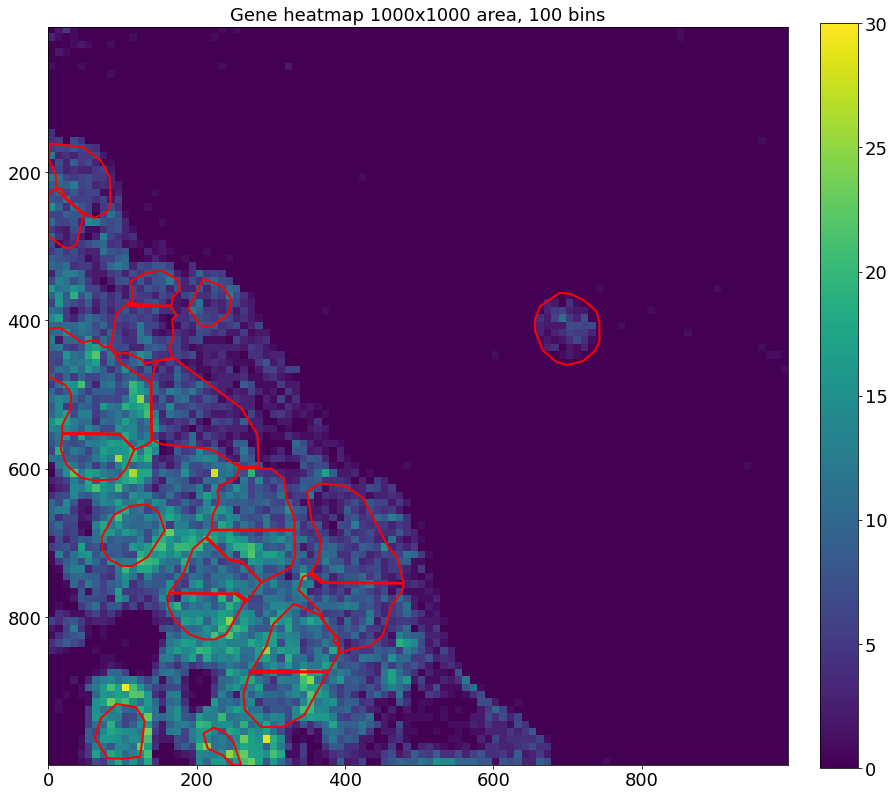

In [94]:
def visualise_all_genes_scattered_in_area(tile_offset=(0,0)):
    converted_coordinates_for_tile = convert_rectangle_to_micron_coordinates(tile_offset, (0, 0, 1_000, 1_000))
    transcripts_query_filter = create_filter_single_rectangle(['global_y', 'global_x'], *converted_coordinates_for_tile)
    transcripts_for_these_regions = detected_transcripts.query(transcripts_query_filter).compute()

    transcripts_for_these_regions_converted = micron_to_pixels(transcripts_for_these_regions.copy(), xy_columns=[('global_y', 'global_x')])
    x = transcripts_for_these_regions_converted['global_x'] - tile_offset[0]
    y = transcripts_for_these_regions_converted['global_y'] - tile_offset[1]

    bins = 100
    heatmap, xedges, yedges = np.histogram2d(x, y, bins=bins)
    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
    
    fig, ax = plt.subplots(figsize=(12,12))
    heatmap = ax.imshow(heatmap.T, extent=extent, origin='lower')
    plt.title(f'Gene heatmap 1000x1000 area, {bins} bins', fontsize=18)
    for props in compute_cell_regions(result_without_plot):
        cell_contour = props['contour']
        plt.plot(np.clip(cell_contour[:, 1], 0, 999), np.clip(cell_contour[:, 0], 0, 999), '-r', linewidth=2)
    ax.invert_yaxis()
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.tight_layout()
    cbar = plt.colorbar(heatmap, fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=18)
    plt.show()



visualise_all_genes_scattered_in_area((0,0))

**Actual gene allocation.**

In [45]:
import math
import time
from scipy.sparse import csr_matrix
from skimage.measure import points_in_poly
from anndata import AnnData


def transcript_in_region(transcript, region):
    x = transcript['global_x']
    y = transcript['global_y']
    
    # Checking if a point is in a polygon is super slow
    # Optimisation: if it is not in the bounding box, it will definitely not be in the polygon
    #               => this is a coarse-grained filtering first
    start_x, start_y, end_x, end_y = region['bbox']
    if start_x <= x <= end_x and start_y <= y <= end_y:
        return points_in_poly([[y, x]], region['contour'])
    return False

def compute_centroid_from_bbox(bbox):
    return [(bbox[0] + bbox[2]) / 2, (bbox[1] + bbox[3]) / 2]

def get_gene_expression_matrix(transcripts_for_regions, regions, regions_len, genes):
    # Don't create an empty csr_matrix that is continuously updated for performance reasons
    gene_expression_matrix = [[0] * len(genes) for _ in range(regions_len)]
    
    for transcript in transcripts_for_regions.to_dict('records'):
        for i, region in enumerate(regions):
            if transcript_in_region(transcript, region):
                g = genes[transcript['gene']]
                gene_expression_matrix[i][g] += 1
                break
    
    coordinates = np.array([region['micron_centroid'] for region in regions])
                
    adata = AnnData(csr_matrix(gene_expression_matrix), obsm={'spatial': coordinates})
    
    adata.obs_names = [f'Cell_{i:d}' for i in range(adata.n_obs)]
    adata.var_names = genes.keys()
                
    return adata     

def convert_region_coordinates(tile_offset, region):
    start_y, start_x, end_y, end_x = region['bbox']
    #print(region['bbox'], region['contour'])
    tile_offset_x, tile_offset_y = tile_offset
    return {
        'bbox': (start_x + tile_offset_x, start_y + tile_offset_y, end_x + tile_offset_x, end_y + tile_offset_y),
        'micron_centroid': compute_centroid_from_bbox(convert_rectangle_to_micron_coordinates(tile_offset, (start_x, start_y, end_x, end_y))),
        'contour': region['contour'] + np.array([tile_offset_y, tile_offset_x])
    }

def gene_allocation(segmented_image, block_info=None):
    start_time = time.time()
    print('block_info', block_info)
    
    if block_info is not None:
        # "If func accepts block_info= or block_id= as keyword arguments, it is passed as a dict"
        array_location = block_info[0]['array-location']
        tile_offset = (array_location[0][0], array_location[1][0])
    else:
        tile_offset = (0, 0)
    
    filtered_regions = compute_cell_regions(segmented_image)
    # We cannot transform the transcript coordinates, because that file is huge and does not fit in main memory well
    # So, we tranform the regions coordinates to the coordinate space of the transcript file
    filtered_regions = list(map(lambda item: convert_region_coordinates(tile_offset, item), filtered_regions))
    
    # Build a single rough query to filter the transcripts csv
    converted_coordinates_for_tile = convert_rectangle_to_micron_coordinates(tile_offset, (0, 0, 1_000, 1_000))
    transcripts_query_filter = create_filter_single_rectangle(['global_y', 'global_x'], *converted_coordinates_for_tile)
    
    # Query transcripts
    # This step computes the filter on the transcripts, note that this takes a while, but shouldn't matter if executed on workers
    # Now 'transcripts_for_these_regions' will contain all transcript entries that overlap with one of our rectangles in this tile chunk
    transcripts_for_these_regions = detected_transcripts.query(transcripts_query_filter).compute()
    transcripts_for_these_regions = micron_to_pixels(transcripts_for_these_regions, xy_columns=[('global_y', 'global_x')])
    print('amount of transcripts:', len(transcripts_for_these_regions))
    
    print('time:', time.time() - start_time)
    
    gem = get_gene_expression_matrix(transcripts_for_these_regions, filtered_regions, len(filtered_regions), genes)

    print('time:', time.time() - start_time)
    return gem

In [46]:
adata = gene_allocation(result_without_plot) # Hier ga je geen block_info mee krijgen, maar 't is voor performance dat ik dit hier zo zet, idealiter persisten we de segmented stuff
#best.map_blocks(preprocessing).map_blocks(segmentation, meta=block_normalized_meta, chunks=(1000,1000)).map_blocks(gene_allocation, meta=block_normalized_meta, chunks=(1000,1000)).compute()

block_info None
amount of transcripts: 24693
time: 37.653300046920776
time: 38.21245193481445


In [47]:
adata.write("out.h5ad")

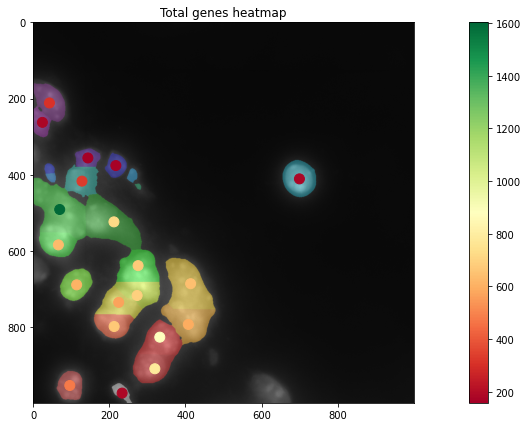

In [48]:
# visualization of total gene counts
total_counts = adata.X.sum(axis=1).flatten().A1

cords_x, cords_y = micron_list_to_pixels(adata.obsm['spatial'])

names = ['image']
fig, ax = plt.subplot_mosaic([names], figsize=(20, 7))
ax['image'].set_title('Total genes heatmap')
ax['image'].imshow(result_with_segments_highlighted_rgb)
img = ax['image'].scatter(cords_x, cords_y, c=total_counts, cmap='RdYlGn', s=100)
plt.colorbar(img, ax=ax['image'])

In [49]:
def get_gene_expression_plot(gene):
    counts = adata.obs_vector(gene)

    cords_x, cords_y = micron_list_to_pixels(adata.obsm['spatial'])

    names = ['image']
    fig, ax = plt.subplot_mosaic([names], figsize=(20, 7))
    ax['image'].set_title('Total '+gene+' genes heatmap')
    ax['image'].imshow(result_with_segments_highlighted_rgb)
    img = ax['image'].scatter(cords_x, cords_y, c=counts, cmap='RdYlGn', s=100)
    plt.colorbar(img, ax=ax['image'])

In [50]:
gene_counts = [(gene_name, int(gene_count)) for (gene_name, gene_count) in zip(genes.keys(), adata.X.sum(axis=0).flatten().A1)]
gene_counts.sort(key=lambda pair: pair[1], reverse=True)
gene_counts

[('Pck1', 924),
 ('Fasn', 460),
 ('G6pc', 453),
 ('Egfr', 297),
 ('Errfi1', 293),
 ('Serping1', 292),
 ('Cebpa', 242),
 ('Acsl1', 209),
 ('Cald1', 208),
 ('Cyp2b9', 207),
 ('Hc', 198),
 ('Sdc1', 182),
 ('Proz', 175),
 ('Sardh', 160),
 ('Alas1', 158),
 ('Psap', 149),
 ('Hsd17b6', 149),
 ('Aldh7a1', 143),
 ('Cxcl12', 130),
 ('Gm2a', 122),
 ('Aldh1b1', 118),
 ('Dpt', 115),
 ('Cyp2c23', 109),
 ('Pabpc1', 105),
 ('Epas1', 103),
 ('Eng', 96),
 ('Abcb4', 92),
 ('Gnai2', 88),
 ('Ctsc', 85),
 ('Akr1a1', 82),
 ('Lsr', 81),
 ('Aqp1', 80),
 ('Comt', 79),
 ('Mmrn1', 79),
 ('Lyve1', 76),
 ('Ugt2a3', 74),
 ('Acss2', 71),
 ('Gpi1', 71),
 ('Hsd17b2', 67),
 ('Eif3a', 67),
 ('Tpi1', 66),
 ('Tkt', 66),
 ('Ldha', 65),
 ('Cyp17a1', 65),
 ('Igf1', 63),
 ('Acaca', 63),
 ('Gpd1', 59),
 ('Psmd3', 58),
 ('Timp3', 58),
 ('Ltbp4', 56),
 ('Pecam1', 55),
 ('H2afy', 53),
 ('Csnk1a1', 51),
 ('Acacb', 50),
 ('Akr1d1', 48),
 ('Hsd17b12', 48),
 ('Pgm1', 47),
 ('Col1a2', 47),
 ('Col6a1', 47),
 ('Notch2', 44),
 ('Pdha1', 4

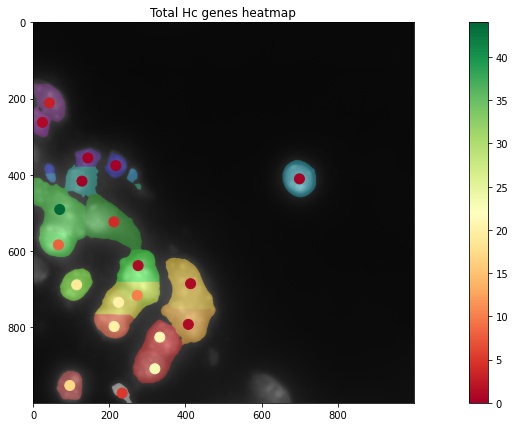

In [51]:
get_gene_expression_plot('Hc')

# Downstream analysis

In [52]:
import scanpy as sc

def reduce_dimensions(adata, min_gene=5, min_cell=5):
    sc.pp.filter_genes(adata, min_counts=min_gene)
    sc.pp.filter_cells(adata, min_counts=min_cell)

### Partial Leiden

In [53]:
print(adata.X.shape)
reduce_dimensions(adata)
print(adata.X.shape)

(20, 385)
(20, 242)


In [54]:
def partial_leiden_cluster(adata, nn=15, resolutions=[1.5]):
    sc.pp.neighbors(adata, n_neighbors=nn)
    keys = []
    
    for res in resolutions:
        key = "leiden_" + str(res)
        sc.tl.leiden(adata, resolution = res, key_added = key)
        keys.append(key)
        
    sc.tl.umap(adata)
    sc.pl.umap(adata, color=keys, size=2000, title="Leiden with resolution="+str(resolutions[0])+" and n_neighbors="+str(nn))
    # Geen idee of tsne moet/nuttig is maar dat wordt precies veel gedaan (Glenn)
    sc.tl.tsne(adata)
    sc.pl.tsne(adata, color=keys, size=1000)
    
    bdata = adata.copy()
    
    pixels = micron_list_to_pixels(adata.obsm['spatial'])
    bdata.obsm['spatial'] = np.array([list(cord) for cord in zip(pixels[0], pixels[1])])
    
    
    for i, key in enumerate(keys):
        fig, ax = plt.subplots(1,1, figsize=(10, 6))
        ax.imshow(result_with_segments_highlighted_rgb)
        ax.set_title("title test")
        sc.pl.spatial(bdata, color=key, spot_size=40, ax=ax, title="Leiden with resolution="+str(resolutions[0])+" and n_neighbors="+str(nn))



         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/ndossche/.conda/envs/scip/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


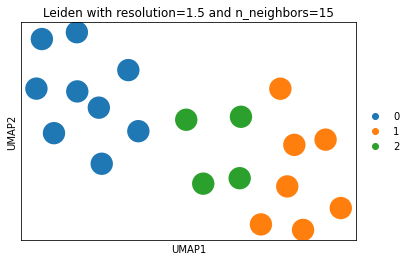

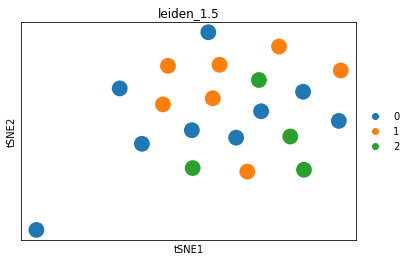

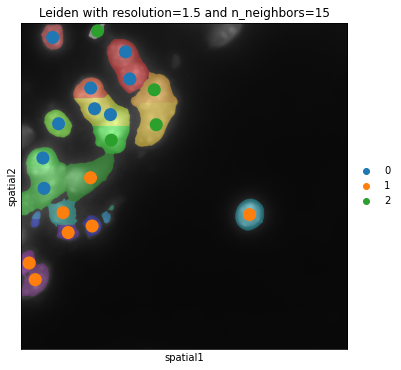

In [55]:
partial_leiden_cluster(adata)

### Full Leiden

In [56]:
def full_leiden_cluster(adata, nn=15, resolutions=[0.4, 0.6, 1.0, 1.4], us=2000, ss=7):
    sc.pp.neighbors(adata, n_neighbors=nn, use_rep='X')
    keys = []
    
    for res in resolutions:
        key = "leiden_" + str(res)
        sc.tl.leiden(adata, resolution = res, key_added = key)
        keys.append(key)
        
    sc.tl.umap(adata)
    sc.pl.umap(adata, color=keys, size=us, title="Leiden with resolution="+str(resolutions[0])+" and n_neighbors="+str(nn))
    
    sc.pl.spatial(adata, color=keys, spot_size=ss, title="Leiden with resolution="+str(resolutions[0])+" and n_neighbors="+str(nn))

In [58]:
import anndata as ad

adatas = []

for i in range(10):
    for j in range(10):
        adatas.append(ad.read_h5ad(f'./tiles/tile_{i}_{j}.h5ad'))
        
full_adata = ad.concat(adatas)

full_adata

/home/ndossche/.conda/envs/scip/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 21597 × 385
    obsm: 'spatial'

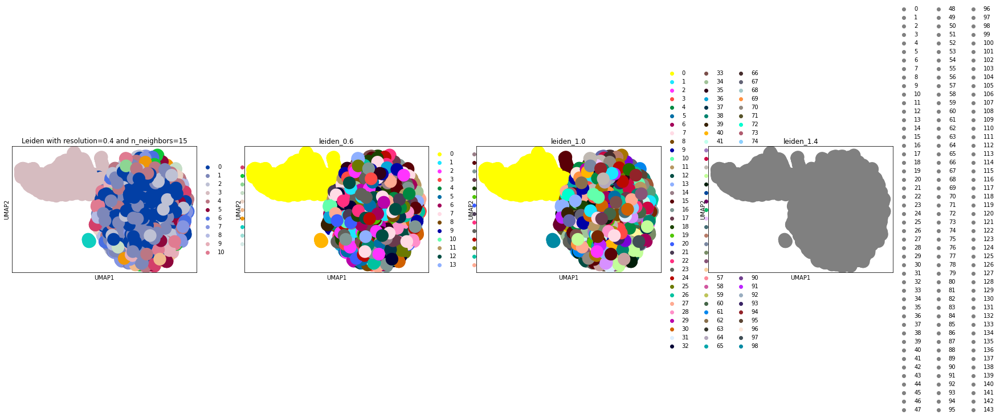

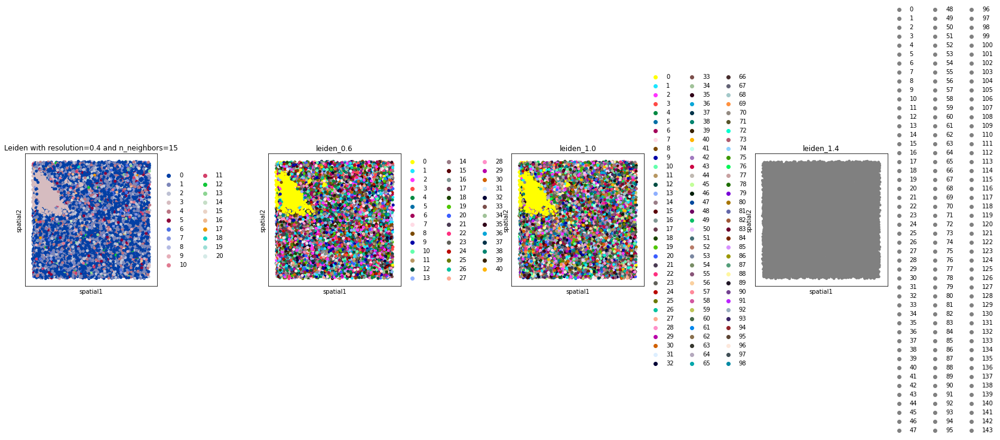

In [60]:
full_leiden_cluster(full_adata)

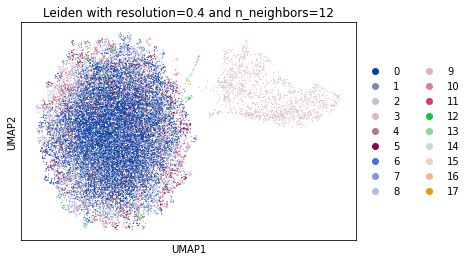

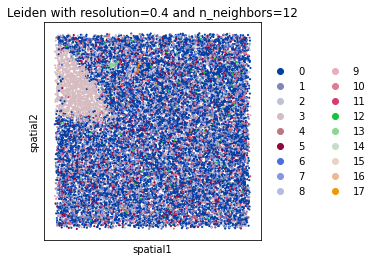

In [61]:
full_leiden_cluster(full_adata, 12, [0.4], 5 , 3)

## Pipeline construction

In [103]:
def gene_allocation(segmented_image, block_info=None):
    start_time = time.time()
    print('block_info', block_info)
    
    # TODO: gebruik dit voor de offset van de huidige image tile te bepalen
    # "If func accepts block_info= or block_id= as keyword arguments, it is passed as a dict"
    tile_offset = (0, 0)
    
    filtered_regions = compute_cell_regions(segmented_image)
    # We cannot transform the transcript coordinates, because that file is huge and does not fit in main memory well
    # So, we tranform the regions coordinates to the coordinate space of the transcript file
    filtered_regions = list(map(lambda item: convert_region_coordinates(tile_offset, item), filtered_regions))
    
    # Build a single rough query to filter the transcripts csv
    converted_coordinates_for_tile = convert_rectangle_to_micron_coordinates(tile_offset, (0, 0, 1_000, 1_000))
    transcripts_query_filter = create_filter_single_rectangle(['global_y', 'global_x'], *converted_coordinates_for_tile)
    
    # Query transcripts
    # This step computes the filter on the transcripts, note that this takes a while, but shouldn't matter if executed on workers
    # Now 'transcripts_for_these_regions' will contain all transcript entries that overlap with one of our rectangles in this tile chunk
    transcripts_for_these_regions = detected_transcripts.query(transcripts_query_filter).compute()
    transcripts_for_these_regions = micron_to_pixels(transcripts_for_these_regions, xy_columns=[('global_y', 'global_x')])
    print('amount of transcripts:', len(transcripts_for_these_regions))
    
    print('time:', time.time() - start_time)
    
    gem = get_gene_expression_matrix(transcripts_for_these_regions, filtered_regions, len(filtered_regions), genes)

    print('time:', time.time() - start_time)
    return transcripts_for_these_regions

In [59]:
def visualize_dask_graph(pipeline, high_level=True):
    if high_level:
        return pipeline.dask
    else:
        return pipeline.visualize()

In [87]:
def pipeline(
    filename,
    projection_operation='max',
    chunks=(7, 1000, 1000)
):
    # Store a .zarr file in a dask array
    zarr_array = da.from_zarr(filename, chunks=chunks)[:, :2000, :2000]

    # Z-stack projection for all blocks
    normalized = zstack_normalization(zarr_array, projection_operation, dtype=np.uint16)
    
    # Chunks after z-stack projection
    projected_chunks = (chunks[1], chunks[2])
    
    # Image preprocessing
    preprocessed = normalized.map_blocks(preprocessing, denoise_fn=gaussian_diff_to_reduce_noise, chunks=projected_chunks)
    
    # Segmentation
    block_normalized_meta = np.array((), dtype=np.float64)
    segmented = preprocessed.map_blocks(segmentation, meta=block_normalized_meta, chunks=projected_chunks)
    
    # Gene allocation
    allocated = segmented.map_blocks(gene_allocation, meta=block_normalized_meta, chunks=projected_chunks)

    return allocated

In [84]:
def pipeline_overlay(
    filename,
    projection_operation='max',
    chunks=(7, 1000, 1000),
    overlay_depth=(500, 500)
):
    # Store a .zarr file in a dask array
    zarr_array = da.from_zarr(filename, chunks=chunks)[:, :2000, :2000]

    # Z-stack projection for all blocks
    normalized = zstack_normalization(zarr_array, projection_operation, dtype=np.uint16)
    
    # Chunks after z-stack projection
    projected_chunks = (chunks[1], chunks[2])
    
    # Image preprocessing
    preprocessed = normalized.map_overlap(preprocessing, denoise_fn=gaussian_diff_to_reduce_noise, chunks=projected_chunks, depth=overlay_depth)
    
    # Segmentation
    block_normalized_meta = np.array((), dtype=np.float64)
    segmented = preprocessed.map_overlap(segmentation, meta=block_normalized_meta, chunks=projected_chunks, depth=overlay_depth)
    
    # Gene allocation
    #allocated = segmented.map_blocks(gene_allocation, meta=block_normalized_meta, chunks=projected_chunks)

    return segmented

In [48]:
visualize_dask_graph(pipeline(CFG_ZARR_IMAGE, projection_operation='max', chunks=(7, 500, 500)), True)

HighLevelGraph with 6 layers.
<dask.highlevelgraph.HighLevelGraph object at 0x7fee99449130>
 0. original-from-zarr-f564e5e56b5a0722ed633e801bff2b9d
 1. from-zarr-f564e5e56b5a0722ed633e801bff2b9d
 2. amax-8cc66b395a13f8feee776e378dd39de5
 3. amax-aggregate-b419f4ac7fafb8dd66d7671e216603e7
 4. preprocessing-75da095685b76d58a8b164ff09437dcc
 5. segmentation-7d57673a4216a051452ed1dc7fc67262

In [ ]:
#result = pipeline(CFG_ZARR_IMAGE_LARGE, chunks=(7, 1000, 1000)).compute()

In [81]:
result_overlay = pipeline_overlay(CFG_ZARR_IMAGE_LARGE, chunks=(7, 1000, 1000), overlay_depth=(250, 250)).compute()

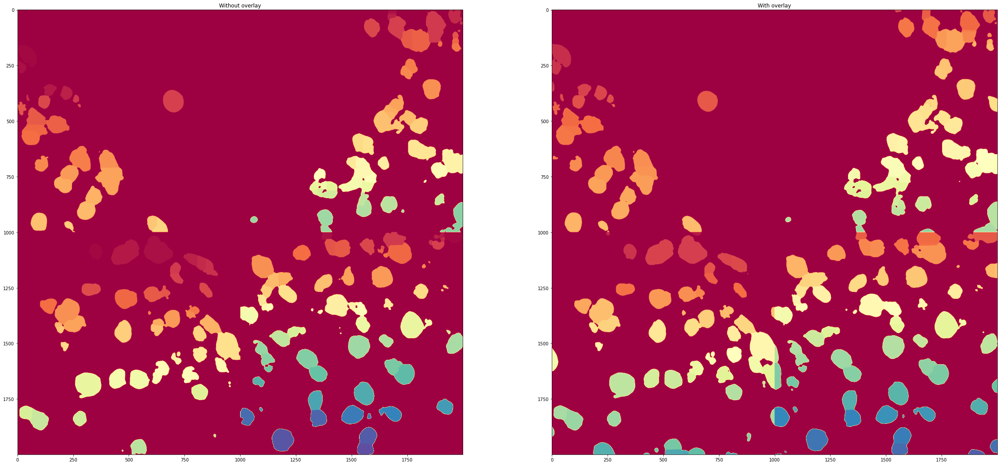

In [82]:
names = ['no_overlay', 'overlay']
fig, ax = plt.subplot_mosaic([names], figsize=(40, 20))
ax['no_overlay'].set_title('Without overlay')
ax['overlay'].set_title('With overlay')

ax['no_overlay'].imshow(result, cmap='Spectral')
ax['overlay'].imshow(result_overlay, cmap='Spectral')

## Reference Cell Segmentation
Note: This code only works with a local Dask client on the cluster, i.e. `IS_REMOTE = False`
This code is currently **obsolete** and has been replaced by the provided binary masks.

In [110]:
# Accidental code execution prevent mechanism
# De code hieronder is heel tijd consumerend en nu niet echt meer nodig wegens dat de binaire reference images gegeven zijn.
assert False, "Bescherming tegen het per ongeluk uitvoeren van de code hieronder als je 'run all' doet"

AssertionError: Bescherming tegen het per ongeluk uitvoeren van de code hieronder als je 'run all' doet

In [12]:
import dask.dataframe as dd
import h5py
import dask.array as da
from pathlib import Path
import holoviews as hv
import matplotlib.pyplot as plt

In [13]:
from pyarrow import fs
hdfs = fs.HadoopFileSystem("bds-head", 9000)
hdfs

In [14]:
features = [el.path for el in hdfs.get_file_info(fs.FileSelector(CFG_CELL_BOUNDARIES, recursive=True))]
len(features)

1791

In [16]:
f = h5py.File(hdfs.open_input_file(features[0]), 'r')
f

<HDF5 file "<pyarrow.lib.NativeFile object at 0x7f6181809690>" (mode r)>

In [17]:
sample = f['featuredata']['103327291694389284070574461648020091166']
sample.keys()

<KeysViewHDF5 ['zIndex_0', 'zIndex_1', 'zIndex_2', 'zIndex_3', 'zIndex_4', 'zIndex_5', 'zIndex_6', 'z_coordinates']>

In [18]:
d = f['featuredata']['103327291694389284070574461648020091166']['zIndex_0']['p_0']['coordinates']
print(d)
d[()]

<HDF5 dataset "coordinates": shape (1, 18, 2), type "<f8">


array([[[2614.76907085,   34.04427795],
        [2617.40833529,   34.83352645],
        [2618.78951889,   36.55352778],
        [2619.13515454,   37.59472842],
        [2618.88355129,   39.11729442],
        [2619.14277716,   40.81678122],
        [2618.77014108,   42.03412706],
        [2616.64153691,   43.72245824],
        [2615.0212206 ,   44.18482297],
        [2612.15555538,   44.17170869],
        [2609.04908146,   43.32865776],
        [2607.64394843,   42.20848424],
        [2607.3781951 ,   41.6045093 ],
        [2607.93678456,   37.26553907],
        [2608.59682645,   35.45151023],
        [2609.6224688 ,   34.74335578],
        [2612.97303637,   33.95723622],
        [2614.76907085,   34.04427795]]])

In [68]:
from spatialpandas import GeoSeries, GeoDataFrame
from spatialpandas.geometry import PolygonArray

# array of 2 segmentation polygon (two copies, one with offset 10)
polygons = PolygonArray([
    [d[0, :, :].flatten()],
    [d[0, :, :].flatten()+10],
])
polygons

NameError: name 'd' is not defined

In [20]:
geo_df = GeoDataFrame({
    'cell_id': [123, 124],
    'z': [0, 1],
    'polygon': polygons,
})
geo_df

,cell_id,z,polygon
0,123,0,"Polygon([[2614.7690708471346, 34.0442779504709..."
1,124,1,"Polygon([[2624.7690708471346, 44.0442779504709..."


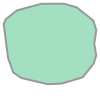

In [21]:
geo_df.polygon[0].to_shapely()

<AxesSubplot:>

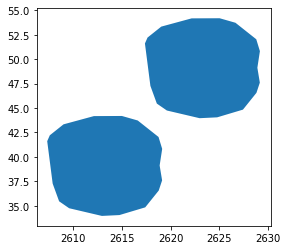

In [22]:
geo_df.to_geopandas().plot()

In [23]:
def load(path, max_z=7):
    f = h5py.File(hdfs.open_input_file(str(path)), "r")
    cells = []
    zs = []
    polygons = []
    for cell, value in f['featuredata'].items():
        for i in range(max_z):
            d = value[f'zIndex_{i}']['p_0']['coordinates']
            polygon = d[0, :, :].flatten()
            cells.append(cell)
            zs.append(i)
            polygons.append([polygon])
    df = GeoDataFrame({
        'cell_id': cells,
        'z': zs,
        'polygon': PolygonArray(polygons),
    })
    return df

In [24]:
load(features[0])

,cell_id,z,polygon
0,103327291694389284070574461648020091166,0,"Polygon([[2614.7690708471346, 34.0442779504709..."
1,103327291694389284070574461648020091166,1,"Polygon([[2614.7690708471346, 34.0442779504709..."
2,103327291694389284070574461648020091166,2,"Polygon([[2614.7690708471346, 34.0442779504709..."
3,103327291694389284070574461648020091166,3,"Polygon([[2614.7690708471346, 34.0442779504709..."
4,103327291694389284070574461648020091166,4,"Polygon([[2614.7690708471346, 34.0442779504709..."
...,...,...,...
695,99471994882184799235845481075474519252,2,"Polygon([[2474.8772212127406, -105.82788698740..."
696,99471994882184799235845481075474519252,3,"Polygon([[2474.8772212127406, -105.82788698740..."
697,99471994882184799235845481075474519252,4,"Polygon([[2474.8772212127406, -105.82788698740..."
698,99471994882184799235845481075474519252,5,"Polygon([[2474.8772212127406, -105.82788698740..."


In [25]:
from dask.delayed import delayed
def get_ddf(n=None):
    ddf = dd.from_delayed([delayed(load)(fn) for fn in features[:n]])
    return ddf

In [26]:
dfs = get_ddf(n=10)
dfs

,cell_id,z,polygon
npartitions=10,,,
,object,int64,polygon[float64]
,...,...,...
...,...,...,...
,...,...,...
,...,...,...


In [27]:
dfs = dfs.compute()
dfs

,cell_id,z,polygon
0,103327291694389284070574461648020091166,0,"Polygon([[2614.7690708471346, 34.0442779504709..."
1,103327291694389284070574461648020091166,1,"Polygon([[2614.7690708471346, 34.0442779504709..."
2,103327291694389284070574461648020091166,2,"Polygon([[2614.7690708471346, 34.0442779504709..."
3,103327291694389284070574461648020091166,3,"Polygon([[2614.7690708471346, 34.0442779504709..."
4,103327291694389284070574461648020091166,4,"Polygon([[2614.7690708471346, 34.0442779504709..."
...,...,...,...
961,94820469945071588014342325903501487068,2,"Polygon([[5017.949685330437, 4750.008924561082..."
962,94820469945071588014342325903501487068,3,"Polygon([[5017.949685330437, 4750.008924561082..."
963,94820469945071588014342325903501487068,4,"Polygon([[5017.949685330437, 4750.008924561082..."
964,94820469945071588014342325903501487068,5,"Polygon([[5017.949685330437, 4750.008924561082..."


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
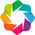

In [28]:
import holoviews as hv
import datashader as ds
hv.extension("bokeh")

In [29]:
def callback(x_range, y_range):
    cvs = ds.Canvas(plot_width=650, plot_height=400, x_range=x_range, y_range=y_range)
    agg = cvs.polygons(dfs, geometry='polygon')
    return hv.Image(agg).opts(cmap="viridis").opts(width=650, height=400)

hv.DynamicMap(
    callback, streams=[hv.streams.RangeXY()]
)

:DynamicMap   []
   :Image   [x,y]   (z)

Note: The cell below may take quite some time to execute (1h+)

In [30]:
subset = get_ddf().cx[4818.3876:4926.3876, 4752.020519999997:4860.020519999997]
subset

,cell_id,z,polygon
npartitions=3,,,
,object,int64,polygon[float64]
,...,...,...
,...,...,...
,...,...,...


In [31]:
subset = subset.compute()
subset

,cell_id,z,polygon
462,193449643300105880709434901902209021281,0,"Polygon([[4832.5272218717755, 4835.03626465856..."
463,193449643300105880709434901902209021281,1,"Polygon([[4832.5272218717755, 4835.03626465856..."
464,193449643300105880709434901902209021281,2,"Polygon([[4832.5272218717755, 4835.03626465856..."
465,193449643300105880709434901902209021281,3,"Polygon([[4832.5272218717755, 4835.03626465856..."
466,193449643300105880709434901902209021281,4,"Polygon([[4832.5272218717755, 4835.03626465856..."
...,...,...,...
1262,7953004162861151164954956479705229197,2,"Polygon([[4851.484351988557, 4844.642676724275..."
1263,7953004162861151164954956479705229197,3,"Polygon([[4851.484351988557, 4844.642676724275..."
1264,7953004162861151164954956479705229197,4,"Polygon([[4851.484351988557, 4844.642676724275..."
1265,7953004162861151164954956479705229197,5,"Polygon([[4851.484351988557, 4844.642676724275..."


In [55]:
subset.to_parquet('1_000_cell_outlines.parq')

We've stored the Cell Outlines as Parquet. It can be loaded after the fact using the code below.

In [35]:
from spatialpandas.io import read_parquet

loaded_subset = read_parquet('1_000_cell_outlines.parq')
loaded_subset

,cell_id,z,polygon
462,193449643300105880709434901902209021281,0,"Polygon([[4832.5272218717755, 4835.03626465856..."
463,193449643300105880709434901902209021281,1,"Polygon([[4832.5272218717755, 4835.03626465856..."
464,193449643300105880709434901902209021281,2,"Polygon([[4832.5272218717755, 4835.03626465856..."
465,193449643300105880709434901902209021281,3,"Polygon([[4832.5272218717755, 4835.03626465856..."
466,193449643300105880709434901902209021281,4,"Polygon([[4832.5272218717755, 4835.03626465856..."
...,...,...,...
1262,7953004162861151164954956479705229197,2,"Polygon([[4851.484351988557, 4844.642676724275..."
1263,7953004162861151164954956479705229197,3,"Polygon([[4851.484351988557, 4844.642676724275..."
1264,7953004162861151164954956479705229197,4,"Polygon([[4851.484351988557, 4844.642676724275..."
1265,7953004162861151164954956479705229197,5,"Polygon([[4851.484351988557, 4844.642676724275..."


<AxesSubplot:>

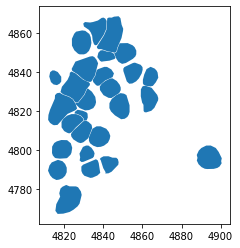

In [36]:
geodf = loaded_subset[loaded_subset.z == 0].to_geopandas()
geodf.plot()

In [37]:
transformed_polygon = geodf.polygon.translate(41.61239999999996, 107.97948000000231)
transformed_polygon = transformed_polygon.affine_transform([1000/108, 0, 0, 1000/108, -45000, -45000])
transformed_polygon

462     POLYGON ((130.922 768.664, 137.870 767.868, 14...
490     POLYGON ((79.589 902.016, 87.471 898.696, 107....
539     POLYGON ((-9.675 304.783, 6.325 311.085, 18.62...
574     POLYGON ((29.325 408.084, 44.339 422.851, 48.5...
756     POLYGON ((108.616 707.338, 120.385 733.693, 13...
770     POLYGON ((9.825 143.373, 40.010 151.421, 58.32...
812     POLYGON ((97.519 479.249, 105.741 482.348, 128...
840     POLYGON ((-36.312 755.989, -19.993 752.819, -6...
847     POLYGON ((152.265 643.776, 161.535 657.958, 16...
896     POLYGON ((28.373 526.880, 37.799 523.799, 48.4...
1078    POLYGON ((-41.862 566.012, -34.527 562.699, -1...
1106    POLYGON ((105.824 389.371, 149.410 407.365, 15...
1274    POLYGON ((126.039 599.233, 124.887 617.672, 12...
1365    POLYGON ((148.724 314.316, 171.323 324.085, 18...
42      POLYGON ((187.805 460.360, 202.973 465.846, 22...
49      POLYGON ((244.449 908.678, 254.267 906.349, 26...
119     POLYGON ((402.576 623.454, 427.277 631.064, 44...
217     POLYGO

<AxesSubplot:>

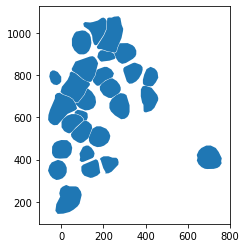

In [38]:
transformed_polygon.plot()

## Scanpy on full 25K DEBUG code

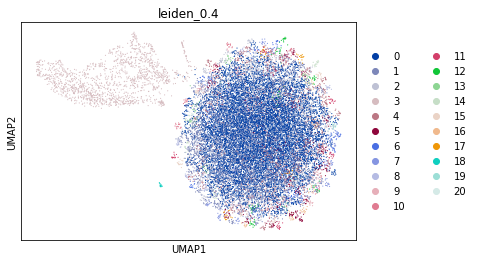

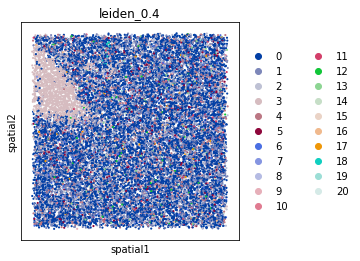

In [26]:
leiden_cluster(full_adata, 15, [0.4])